In [1071]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import cv2 as cv
from numpy.fft import fft2, fftshift,ifftshift

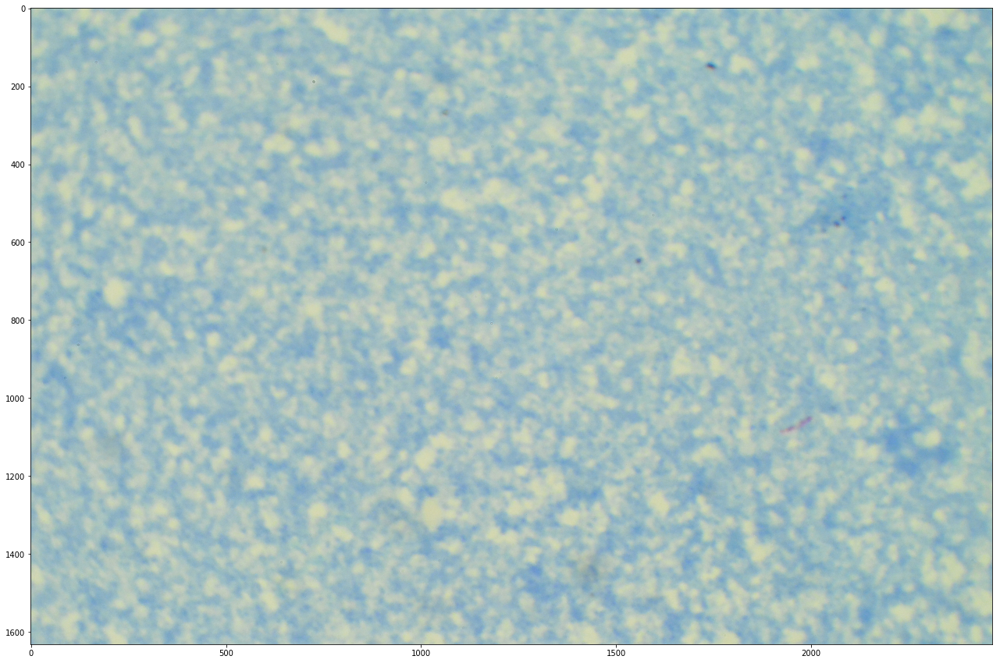

In [1072]:
image = cv.imread('test_image.jpg')
# change the color orderding
image = image[:,:,::-1]
fig = plt.figure(figsize=(40,15))
plt.imshow(image)

In [1128]:
sizeX = 256
sizeY = 256
x,y = np.mgrid[-sizeY/2:sizeY/2, -sizeX/2:sizeX/2]

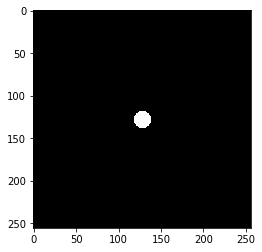

In [1167]:
radius = 10
disk = (np.sqrt(x**2 + y**2) < radius).astype(float)
plt.imshow(disk, cmap='gray')

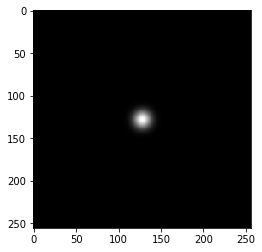

In [1168]:
radius = 10
gaussian = np.exp(-(x**2/float(radius**2)+y**2/float(radius**2)))
gaussian /= np.sum(gaussian)
plt.imshow(gaussian, cmap='gray')

In [1169]:
from scipy.special import j1 as bessel1D

/home/emir/.local/lib/python3.5/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


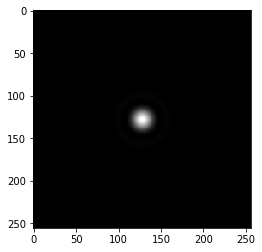

In [1170]:
radius = 35
r = np.sqrt(x**2 + y**2)
X = 2 * np.pi * r / radius
airy_disk = (2 * bessel1D(X) / X)**2
# take care of inf and nan values
airy_disk[np.isinf(airy_disk)] = 1
airy_disk[np.isnan(airy_disk)] = 1
# normalize
airy_disk /= np.sum(airy_disk)
plt.imshow(airy_disk, cmap='gray')

In [1077]:
gray = cv.cvtColor(image,cv.COLOR_RGB2GRAY)

Mean of the original: 182.477323209
Mean of the smoothed: 182.477803408


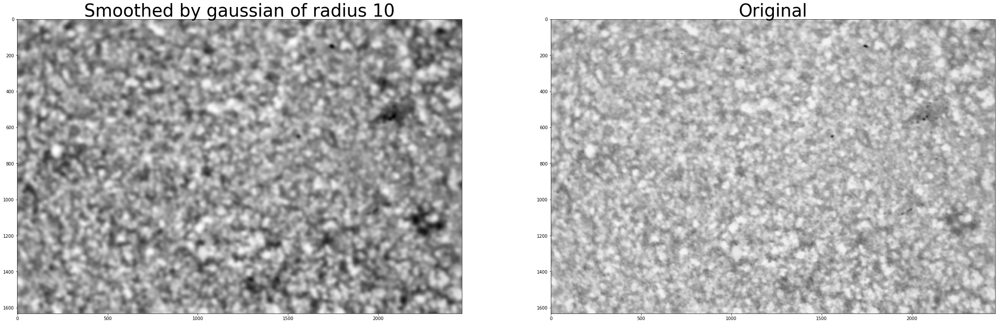

In [1171]:
radius = 10
gaussian = np.exp(-(x**2/float(radius**2)+y**2/float(radius**2)))
gaussian /= np.sum(gaussian)

g_smoothed = cv.filter2D(gray,-1, gaussian)
fig = plt.figure(figsize=(40,15))
fig.add_subplot(121)
plt.imshow(g_smoothed, cmap='gray')
plt.title('Smoothed by gaussian of radius %d' %radius, fontsize=40)
fig.add_subplot(122)
plt.imshow(gray, cmap='gray')
plt.title('Original', fontsize=40)
print('Mean of the original:',np.mean(gray))
print('Mean of the smoothed:',np.mean(g_smoothed))

/home/emir/.local/lib/python3.5/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


Mean of the original: 182.477323209
Mean of the smoothed: 182.477915314


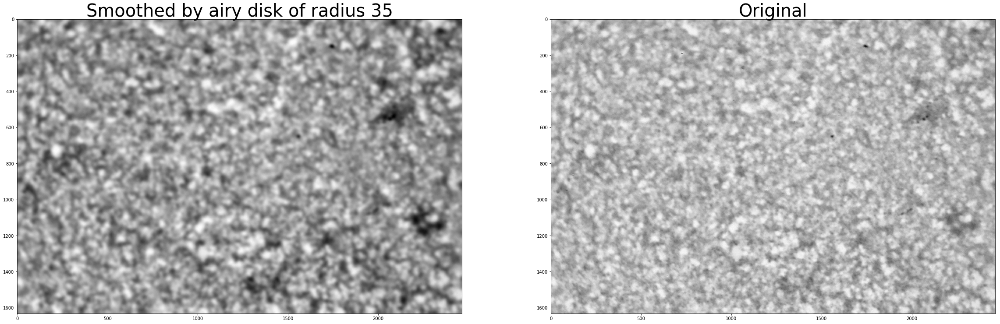

In [1172]:
radius = 35
r = np.sqrt(x**2 + y**2)
X = 2 * np.pi * r / radius
airy_disk = (2 * bessel1D(X) / X)**2
# take care of inf and nan values
airy_disk[np.isinf(airy_disk)] = 1
airy_disk[np.isnan(airy_disk)] = 1
# normalize
airy_disk /= np.sum(airy_disk)

airy_smoothed = cv.filter2D(gray,-1, airy_disk)
fig = plt.figure(figsize=(40,15))
fig.add_subplot(121)
plt.imshow(airy_smoothed, cmap='gray')
plt.title('Smoothed by airy disk of radius %d' %radius, fontsize=40)
fig.add_subplot(122)
plt.imshow(gray, cmap='gray')
plt.title('Original', fontsize=40)
print('Mean of the original:',np.mean(gray))
print('Mean of the smoothed:',np.mean(airy_smoothed))

Mean of the original: 182.477323209
Mean of the smoothed: 182.477708662


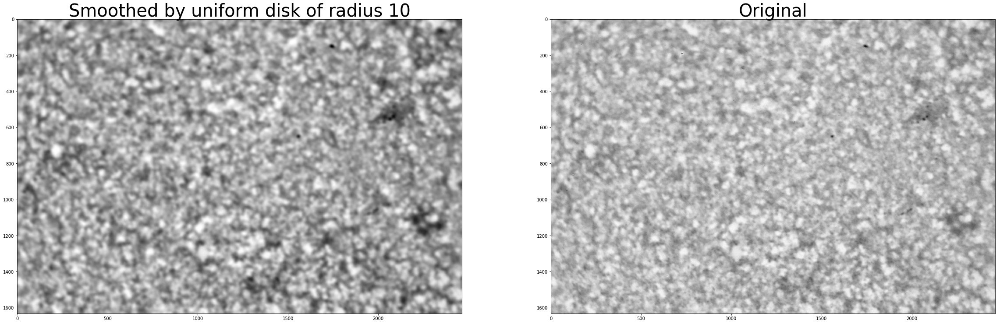

In [1173]:
radius = 10
disk = (np.sqrt(x**2 + y**2) < radius).astype(float)
disk /= disk.sum()

disk_smoothed = cv.filter2D(gray,-1, disk)
fig = plt.figure(figsize=(40,15))
fig.add_subplot(121)
plt.imshow(disk_smoothed, cmap='gray')
plt.title('Smoothed by uniform disk of radius %d' %radius, fontsize=40)
fig.add_subplot(122)
plt.imshow(gray, cmap='gray')
plt.title('Original', fontsize=40)
print('Mean of the original:',np.mean(gray))
print('Mean of the smoothed:',np.mean(disk_smoothed))

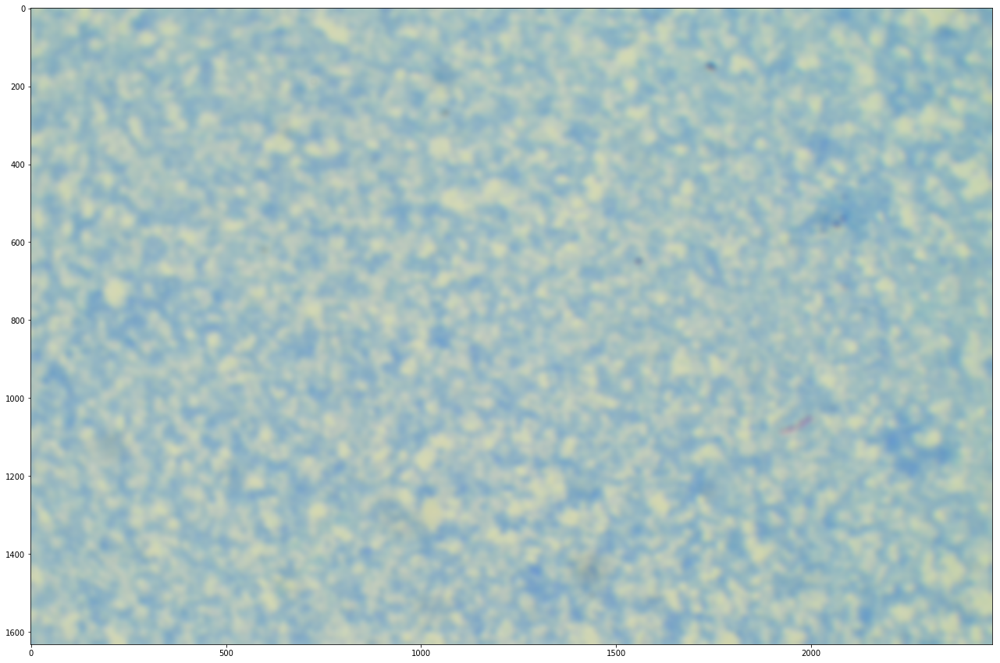

In [1183]:
disk_smoothed = cv.merge([cv.filter2D(cv.split(image)[i],-1, disk) for i in range(3)])
fig = plt.figure(figsize=(40,15))
plt.imshow(disk_smoothed)

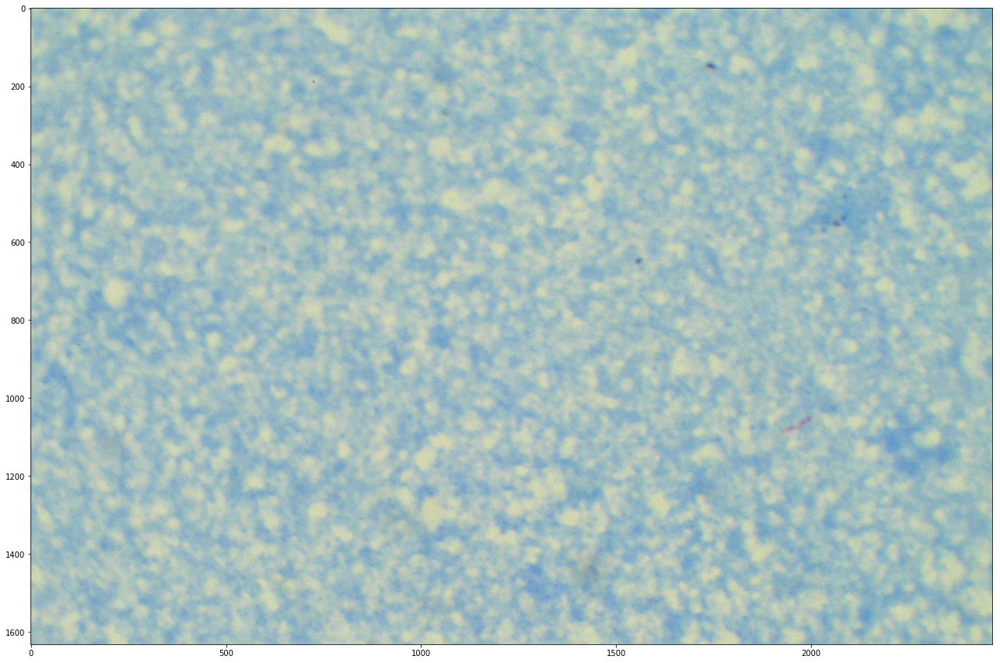

In [1264]:
gauss_noise_mean = 0.0
gauss_noise_std = 1.0 
gauss_noise = np.random.normal(gauss_noise_mean, gauss_noise_std / 255.0, image.shape)
poisson_val = 0.1
noisy = np.random.poisson(image / poisson_val) * poisson_val /255.0
noisy += gauss_noise
fig = plt.figure(figsize=(40,15))
plt.imshow(noisy)

In [1306]:
class Defocuser(object):
    def __init__(self, radius, type_ = 'disk', noise_poisson = 0.1, noise_gauss = 1.0):
        self.radius = radius
        self.type = type_
        self.poisson_val = noise_poisson
        self.gauss_noise_std = noise_gauss
        
        sizeX = 256
        sizeY = 256
        x,y = np.mgrid[-sizeY/2:sizeY/2, -sizeX/2:sizeX/2]
        
        if self.type == 'disk':
            self.kernel = (np.sqrt(x**2 + y**2) < self.radius).astype(float)
            self.kernel /= self.kernel.sum()
            
        elif self.type == 'airy':
            self.radius *= 3.5
            r = np.sqrt(x**2 + y**2)
            X = 2 * np.pi * r / self.radius
            airy_disk = (2 * bessel1D(X) / X)**2
            # take care of inf and nan values
            airy_disk[np.isinf(airy_disk)] = 1
            airy_disk[np.isnan(airy_disk)] = 1
            # normalize
            airy_disk /= np.sum(airy_disk)
            self.kernel = airy_disk
        
        elif self.type == 'gauss':
            gaussian = np.exp(-(x**2/float(self.radius**2)+y**2/float(self.radius**2)))
            gaussian /= np.sum(gaussian)
            self.kernel = gaussian
        
    def applyNoise(self, image):
        gauss_mean = 0.0
        gauss_noise = np.random.normal(gauss_mean, self.gauss_noise_std / 255.0, image.shape)
        noisy = np.random.poisson(image / self.poisson_val) * self.poisson_val /255.0
        noisy += gauss_noise
        return noisy
        
    def apply(self, image):
        smoothed = cv.merge([cv.filter2D(cv.split(image)[i],-1, self.kernel) for i in range(3)])
        return self.applyNoise(smoothed)

/home/emir/.local/lib/python3.5/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide


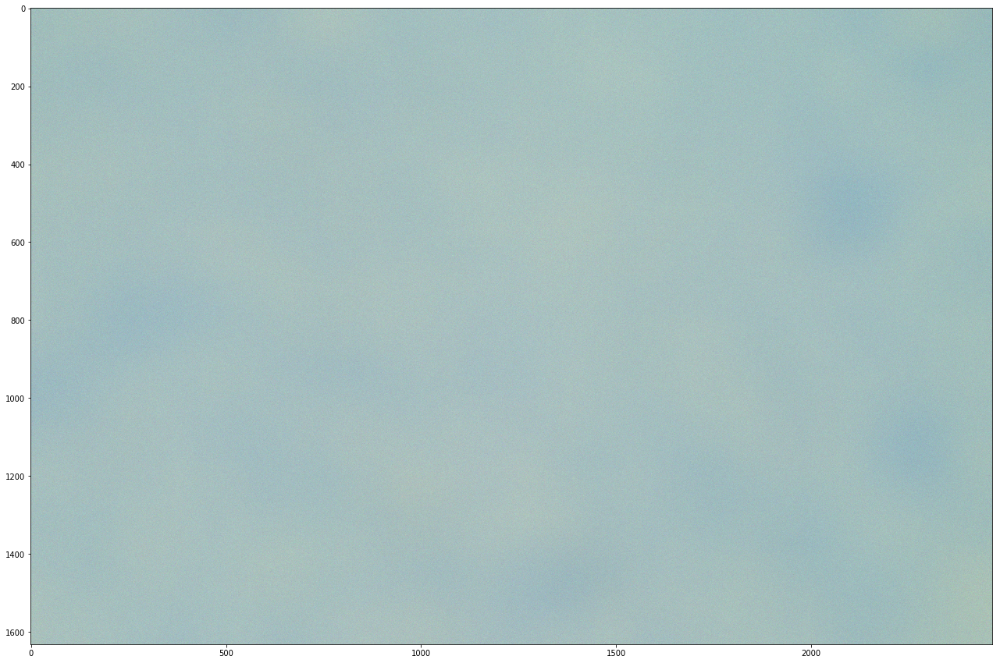

In [1314]:
defocus = Defocuser(120, type_='airy')
test = defocus.apply(image)
fig = plt.figure(figsize=(40,15))
plt.imshow(test)

## PSF Creation, adding Defocus to an Airy

In [962]:
# http://kmdouglass.github.io/posts/simple-pupil-function-calculations.html

# Setup the simulation parameters
wavelength = 0.68   # microns
NA         = 0.6    # Numerical aperture of the objective
pixelSize  = 0.1    # microns
numPixels  = 1632   # Number of pixels in the camera; keep this even
power      = 0.1    # Watts
Z0         = 376.73 # Ohms; impedance of free space

In [963]:
# Create the image plane coordinates
x = np.linspace(-pixelSize * numPixels / 2, pixelSize * numPixels / 2, num = numPixels, endpoint = True)

In [964]:
# Create the Fourier plane
dx = x[1] - x[0]    # Sampling period, microns
fS = 1 / dx         # Spatial sampling frequency, inverse microns
df = fS / numPixels # Spacing between discrete frequency coordinates, inverse microns
fx = np.arange(-fS / 2, fS / 2, step = df) # Spatial frequency, inverse microns

In [965]:
# Create the pupil, which is defined by the numerical aperture
fNA             = NA / wavelength # radius of the pupil, inverse microns
pupilRadius     = fNA / df        # pixels

In [966]:
pupilCenter     = numPixels / 2   # assumes numPixels is even
W, H            = np.meshgrid(np.arange(0, numPixels), np.arange(0, numPixels)) # coordinates of the array indexes
pupilMask       = np.sqrt((W - pupilCenter)**2 + (H - pupilCenter)**2) <= pupilRadius

In [967]:
import scipy
from scipy.integrate import simps
# Compute normalizing constant
norm_factor = simps(simps(np.abs(pupilMask)**2, dx = df), dx = df) / Z0 # A^2
print('Normalization constant:\t\t{:.4f} W'.format(np.sqrt(norm_factor)))

# Renormalize the pupil values
pupil = pupilMask * (1 + 0j)
normedPupil = pupil * np.sqrt(power / norm_factor)

new_power = simps(simps(np.abs(normedPupil)**2, dx = df), dx = df) / Z0
print('User-defined power:\t\t{:.4f} W'.format(power))
print('Power now carried by field:\t{:.4f} W'.format(new_power))

Normalization constant:		0.0806 W
User-defined power:		0.1000 W
Power now carried by field:	0.1000 W


Power in pupil plane: 0.1000 W


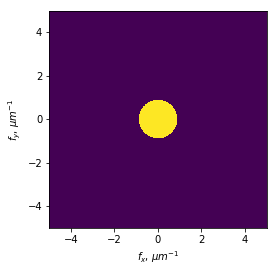

In [968]:
# Show the pupil
ax = plt.imshow(np.abs(normedPupil), extent = [fx[0], fx[-1], fx[0], fx[-1]])
plt.xlabel('$f_x$, $\mu m^{-1}$')
plt.ylabel('$f_y$, $\mu m^{-1}$')
# Compute the power
power_pupil = simps(simps(np.abs(normedPupil)**2, dx = df), dx = df) / Z0
print('Power in pupil plane: {:.4f} W'.format(power_pupil))

(-2, 2)

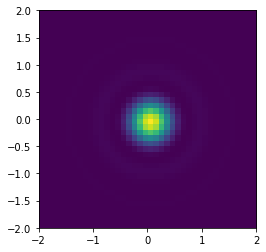

In [969]:
psf_a = fftshift(fft2(ifftshift(normedPupil))) * df**2
psf_Unabberated = np.abs(psf_a)**2

# Show the image plane
img = plt.imshow(psf_Unabberated, interpolation='nearest', extent = [x[0], x[-1], x[0], x[-1]])
plt.gca().set_xlim((-2, 2))
plt.gca().set_ylim((-2, 2))

In [1015]:
from scipy import signal

In [1016]:
KX, KY = np.meshgrid(fx, fx)

In [1055]:
defocusPSF      = np.zeros((numPixels, numPixels))
z = 10000.0001
nImmersion = 1.51 # Refractive index of the immersion oil
defocusPhaseAngle   = 1j * z * np.sqrt((2 * np.pi * nImmersion / wavelength)**2 - KX**2 - KY**2 + 0j)
defocusKernel       = np.exp(defocusPhaseAngle)
defocusPupil        = normedPupil * defocusKernel
defocusPSFA         = fftshift(fft2(ifftshift(defocusPupil))) * df**2
defocusPSF          = np.real(defocusPSFA * np.conj(defocusPSFA))

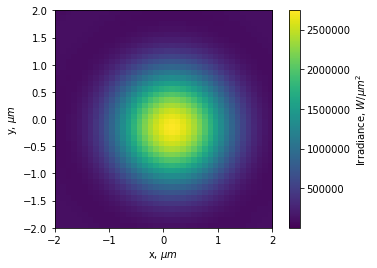

In [787]:
# Show the image plane
img = plt.imshow(defocusPSF, interpolation='nearest', extent = [x[0], x[-1], x[0], x[-1]])
cb = plt.colorbar(img)
plt.gca().set_xlim((-2, 2))
plt.gca().set_ylim((-2, 2))

plt.xlabel('x, $\mu m$')
plt.ylabel('y, $\mu m$')
cb.set_label('Irradiance, $W / \mu m^2$')

(-2, 2)

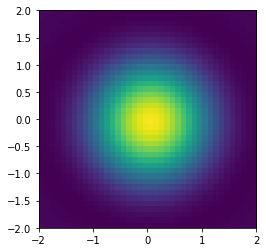

In [788]:
# Show the image plane
img = plt.imshow(defocusPSF, vmax=np.max(psf_Unabberated), interpolation='nearest', extent = [x[0], x[-1], x[0], x[-1]])
plt.gca().set_xlim((-2, 2))
plt.gca().set_ylim((-2, 2))

### Playing around with convolutions

In [579]:
grayFFT = np.fft.fftn(gray[256:512, 256:512])
psfFFT = np.fft.fftn(psf_Unabberated / np.sum(psf_Unabberated)) + 0.001
convolved = np.fft.ifftn(grayFFT*psfFFT)
convolved = np.abs(convolved)

In [580]:
rev = np.fft.fftn(convolved)
deconvolved = np.fft.ifftn(rev/psfFFT)
deconvolved = np.abs(deconvolved)

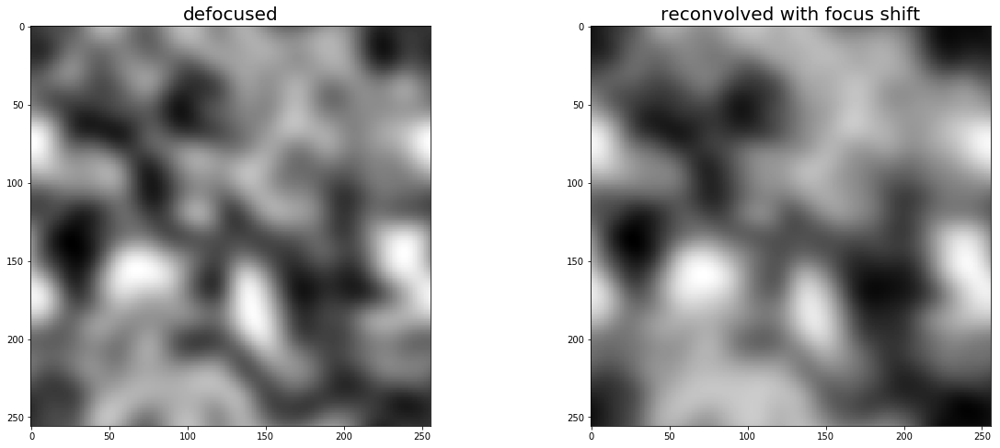

In [581]:
deconvolvedFFT = np.fft.fftn(deconvolved)
psfFFT = np.fft.fftn(defocusPSF / np.sum(defocusPSF)) + 0.001
reconvolved = np.fft.ifftn(deconvolvedFFT*psfFFT)
reconvolved = np.abs(reconvolved)
fig = plt.figure(figsize=(20,8))
fig.add_subplot(121)
plt.imshow(convolved, cmap='gray')
plt.title('defocused', fontsize=20)
fig.add_subplot(122)
plt.imshow(reconvolved, cmap='gray')
plt.title('reconvolved with focus shift', fontsize=20)

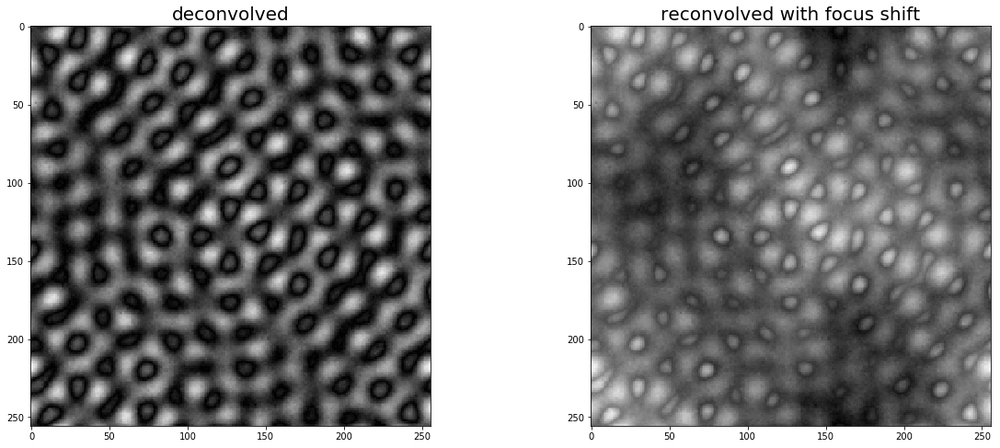

In [582]:
rev = np.fft.fftn(gray[256:512, 256:512])
psfFFT = np.fft.fftn(psf_Unabberated / np.sum(psf_Unabberated)) + 0.1
deconvolved = np.fft.ifftn(rev/psfFFT)
deconvolved = np.abs(deconvolved)

deconvolvedFFT = np.fft.fftn(deconvolved)
psfFFT = np.fft.fftn(defocusPSF / np.sum(defocusPSF)) + 0.1
reconvolved = np.fft.ifftn(deconvolvedFFT*psfFFT)
reconvolved = np.abs(reconvolved)
fig = plt.figure(figsize=(20,8))
fig.add_subplot(121)
plt.imshow(deconvolved, cmap='gray')
plt.title('deconvolved', fontsize=20)
fig.add_subplot(122)
plt.imshow(reconvolved, cmap='gray')
plt.title('reconvolved with focus shift', fontsize=20)